In [1]:
# Study: EDA - NIH Chest X-Rays
# Author: Willian Oliveira
# Start: 13/09/2022
# Motivation: Test several image-processing techniques to identify diagnoses enhancement possibilities
# Study Status: On going

In [2]:
import pandas as pd
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt
import cv2

In [3]:
all_image_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('images*', '*', '*.png'))}

In [4]:
prepared_df = pd.read_csv('prepared_df.csv', index_col=0)

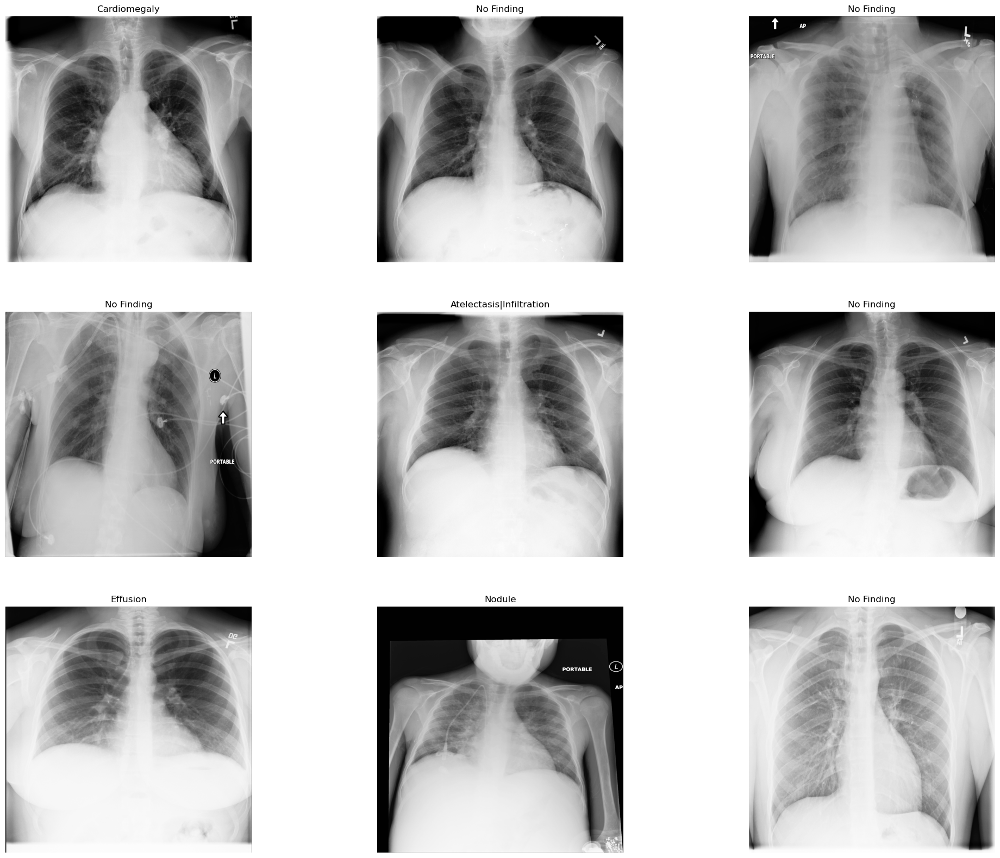

In [5]:
# Lets see some of the original exams
def plot9exams():
    fig = plt.figure(figsize=(25, 20))
    i = 1
    for paths, labels in prepared_df[['path', 'Finding Labels']].values[:9000:1000]:
        img = plt.imread(paths)
        fig.add_subplot(3,3,i).set_title(labels)
        plt.imshow(img , cmap='Greys_r')
        plt.axis('off')
        i+=1

plot9exams()

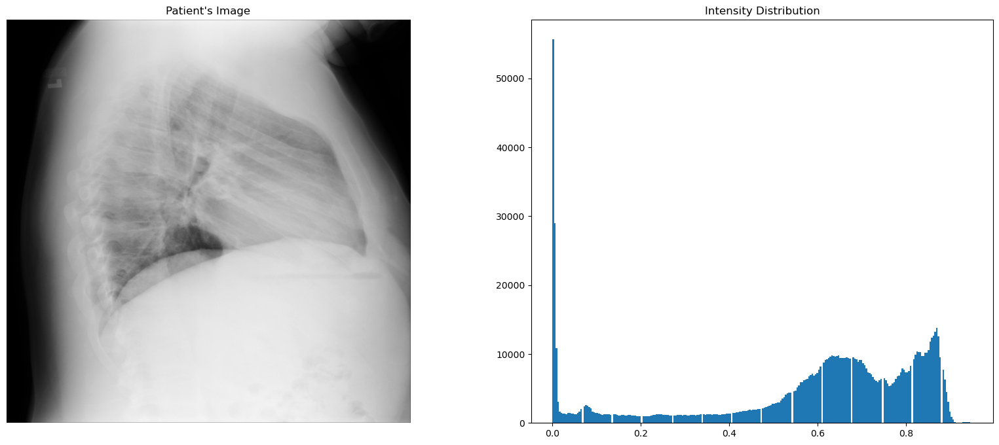

In [6]:
# Avaluate pixel intensity distribution on a single image (using '00008082_000.png' to show the LAT image that is rotulated as AP (see 00_EDA.ipynb)
def show_image_hist(img_path):
    import matplotlib.pyplot as plt
    
    f=plt.figure(figsize= (20,8))
    
    s1 = f.add_subplot(1, 2, 1)
    s1.set_title("Patient's Image")
    img= plt.imread(img_path)
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    s2 = f.add_subplot(1,2, 2)
    s2.set_title('Intensity Distribution')
    plt.hist(img.ravel(), bins = 256)

    plt.show()

show_image_hist(all_image_paths['00008082_000.png'])

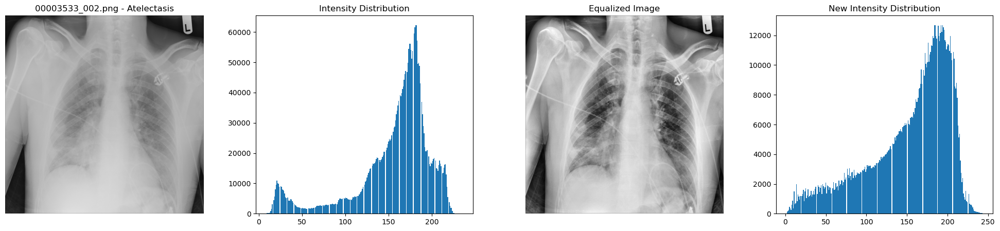

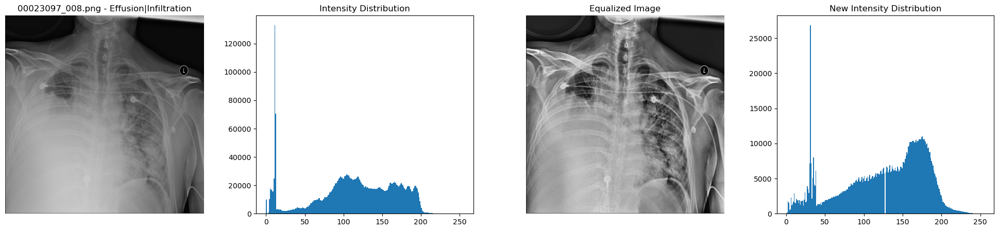

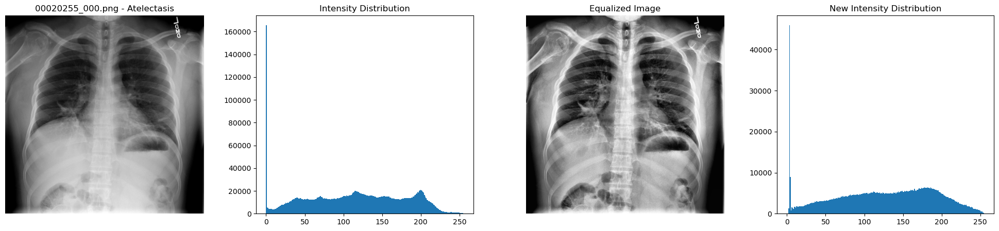

In [7]:
# Applying Contrast Limited Adaptive Histogram Equalization to some images
def CLAHE_image(img_path, II, label, cl = 2 , gs = (8,8)):
    import matplotlib.pyplot as plt
    import cv2
    f=plt.figure(figsize= (25,5))
    
    s1 = f.add_subplot(1, 4, 1)
    s1.set_title(f'{II} - {label}')
    img= cv2.imread(img_path)
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    
    s2 =  f.add_subplot(1, 4, 2)
    s2.set_title('Intensity Distribution')
    plt.hist(img.ravel(), bins = 256)

    clahe = cv2.createCLAHE(clipLimit=cl, tileGridSize=gs)
    grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    s3 = f.add_subplot(1, 4, 3)
    s3.set_title('Equalized Image')
    clahe_img = clahe.apply(grayimg)
    plt.imshow(clahe_img, cmap = 'gray')
    plt.axis('off')

    s4 =  f.add_subplot(1, 4, 4)
    s4.set_title('New Intensity Distribution')
    plt.hist(clahe_img.ravel(), bins = 256)

sampled_images = prepared_df['Finding Labels'].sample(3)
for index, label in sampled_images.iteritems():   
    CLAHE_image(all_image_paths[index], index, label , cl = 3 , gs = (8,8))
del(sampled_images)

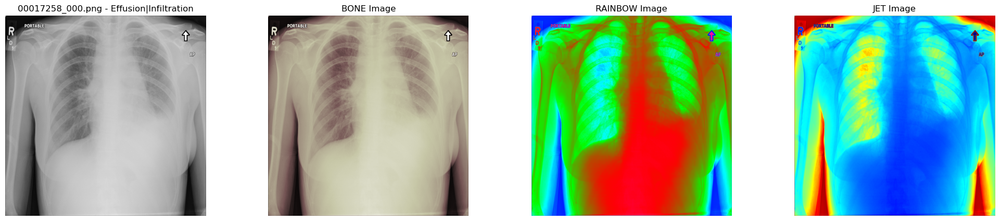

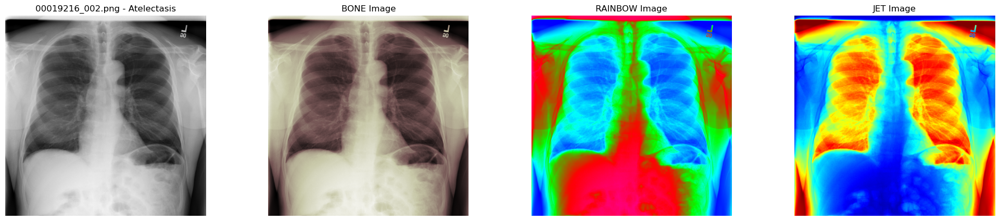

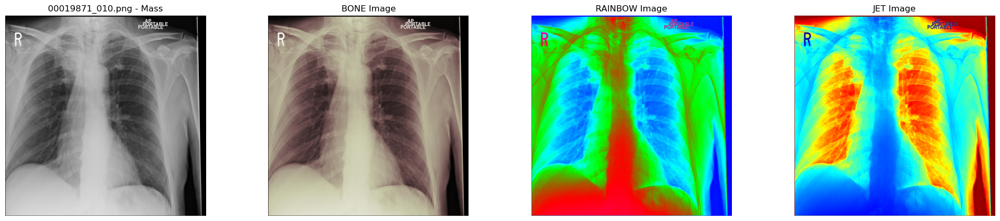

In [8]:
# Testing some Pseudocoloring stuff on images
def Pseudocolorize(img_path, II, label):
    import cv2
    f=plt.figure(figsize= (25, 5))
    
    s1 = f.add_subplot(1, 4, 1)
    s1.set_title(f'{II} - {label}')
    img= cv2.imread(img_path)
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    grayimg = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    BONE_IMG = cv2.applyColorMap(grayimg, cv2.COLORMAP_BONE)
    RAINBOW_IMG = cv2.applyColorMap(grayimg, cv2.COLORMAP_RAINBOW)
    JET_IMG = cv2.applyColorMap(grayimg, cv2.COLORMAP_JET)
    
    s2 = f.add_subplot(1, 4, 2)
    s2.set_title('BONE Image')
    plt.imshow(BONE_IMG, cmap = 'gray')
    plt.axis('off')

    s3 = f.add_subplot(1, 4, 3)
    s3.set_title('RAINBOW Image')
    plt.imshow(RAINBOW_IMG, cmap = 'gray')
    plt.axis('off')

    s4 = f.add_subplot(1, 4, 4)
    s4.set_title('JET Image')
    plt.imshow(JET_IMG, cmap = 'gray')
    plt.axis('off')

sampled_images = prepared_df['Finding Labels'].sample(3)
for index, label in sampled_images.iteritems():   
    Pseudocolorize(all_image_paths[index], index, label)
del(sampled_images)

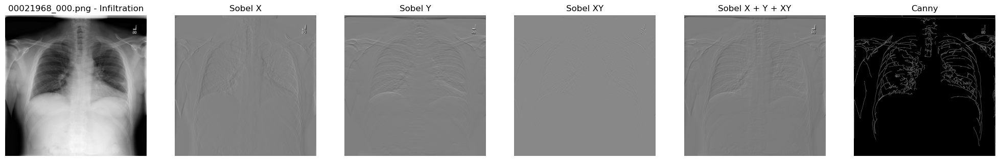

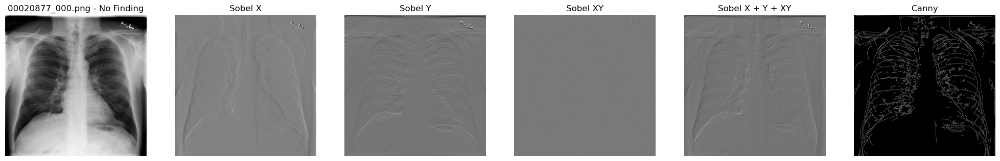

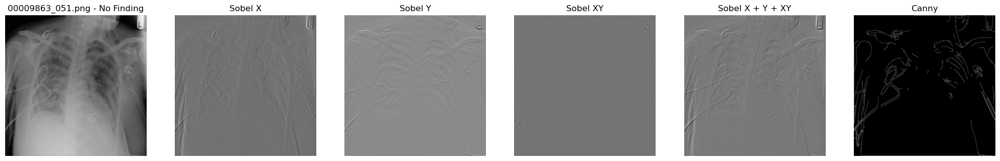

In [9]:
# Applying Sobel and Canny Edge Detection to some images
def ApplyED(img_path, II, label, KSIZE = 5, threshold1=15, threshold2=55):
    import cv2

    original_img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
    blur_img = cv2.GaussianBlur(gray_img, (5,5), 0)
    img_flow = blur_img
    sobelx = cv2.Sobel(src=img_flow, ddepth=cv2.CV_64F, dx=1, dy=0, ksize = KSIZE) # Sobel Edge Detection on the X axis
    sobely = cv2.Sobel(src=img_flow, ddepth=cv2.CV_64F, dx=0, dy=1, ksize = KSIZE) # Sobel Edge Detection on the Y axis
    sobelxy = cv2.Sobel(src=img_flow, ddepth=cv2.CV_64F, dx=1, dy=1, ksize = KSIZE) # Combined X and Y Sobel Edge Detection
    canny =  cv2.Canny(image=img_flow, threshold1=threshold1, threshold2=threshold2)
    sobeladd = sobelx + sobely + sobelxy
  

    f=plt.figure(figsize= (25, 5))
    s1 = f.add_subplot(1, 6, 1)
    s1.set_title(f'{II} - {label}')
    plt.imshow(gray_img, cmap='gray')
    plt.axis('off')

    s2 = f.add_subplot(1, 6, 2)
    s2.set_title('Sobel X')
    plt.imshow(sobelx, cmap='gray')
    plt.axis('off')

    s3 = f.add_subplot(1, 6, 3)
    s3.set_title('Sobel Y')
    plt.imshow(sobely, cmap='gray')
    plt.axis('off')

    s4 = f.add_subplot(1, 6, 4)
    s4.set_title('Sobel XY')
    plt.imshow(sobelxy, cmap='gray')
    plt.axis('off')

    s5 = f.add_subplot(1, 6, 5)
    s5.set_title('Sobel X + Y + XY')
    plt.imshow(sobeladd, cmap='gray')
    plt.axis('off')

    s6 = f.add_subplot(1, 6, 6)
    s6.set_title('Canny')
    plt.imshow(canny, cmap='gray')
    plt.axis('off')

sampled_images = prepared_df['Finding Labels'].sample(3)
for index, label in sampled_images.iteritems():
    ApplyED(all_image_paths[index], index, label) 
del(sampled_images)  

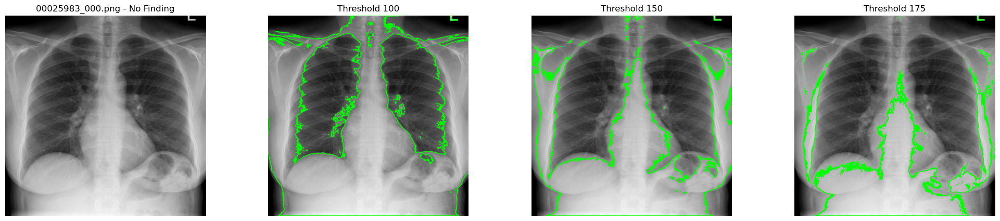

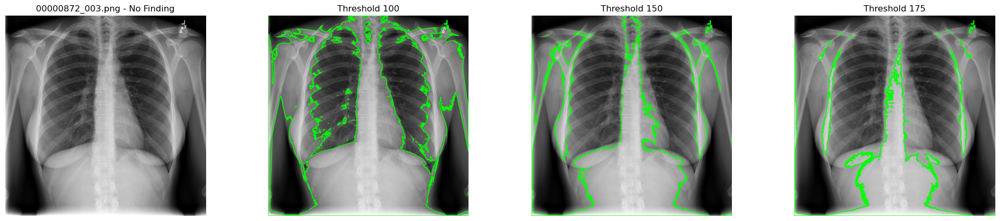

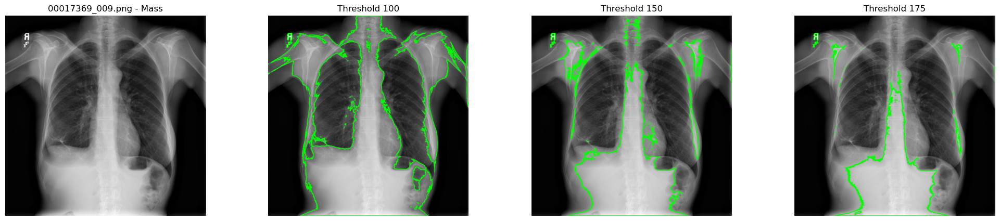

In [10]:
# Applying Countour Detection with different binary threshold intensities
def ContourDetection(img_path, II, label, threshold1=100, threshold2=150, threshold3=175 ):

    import cv2
    
    img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, thresh1 = cv2.threshold(gray_img, threshold1, 255, cv2.THRESH_BINARY)
    ret, thresh2 = cv2.threshold(gray_img, threshold2, 255, cv2.THRESH_BINARY)
    ret, thresh3 = cv2.threshold(gray_img, threshold3, 255, cv2.THRESH_BINARY)

    contours1, hierarchy1 = cv2.findContours(thresh1, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours2, hierarchy2 = cv2.findContours(thresh2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours3, hierarchy3 = cv2.findContours(thresh3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    img1 = img.copy()
    img2 = img.copy()
    img3 = img.copy()

    contour1 = cv2.drawContours(img1, contours1, -1, (0, 255, 0), 2, cv2.LINE_AA)
    contour2 = cv2.drawContours(img2, contours2, -1, (0, 255, 0), 2, cv2.LINE_AA)
    contour3 = cv2.drawContours(img3, contours3, -1, (0, 255, 0), 2, cv2.LINE_AA)

    f=plt.figure(figsize= (25, 5))
    s1 = f.add_subplot(1, 4, 1)
    s1.set_title(f'{II} - {label}')
    plt.imshow(gray_img, cmap='gray')
    plt.axis('off')

    s2 = f.add_subplot(1, 4, 2)
    s2.set_title(f'Threshold {threshold1}')
    plt.imshow(contour1, cmap='gray')
    plt.axis('off')

    s3 = f.add_subplot(1, 4, 3)
    s3.set_title(f'Threshold {threshold2}')
    plt.imshow(contour2, cmap='gray')
    plt.axis('off')

    s4 = f.add_subplot(1, 4, 4)
    s4.set_title(f'Threshold {threshold3}')
    plt.imshow(contour3, cmap='gray')
    plt.axis('off')

sampled_images = prepared_df['Finding Labels'].sample(3)
for index, label in sampled_images.iteritems():
    ContourDetection(all_image_paths[index], index, label) 
del(sampled_images)  

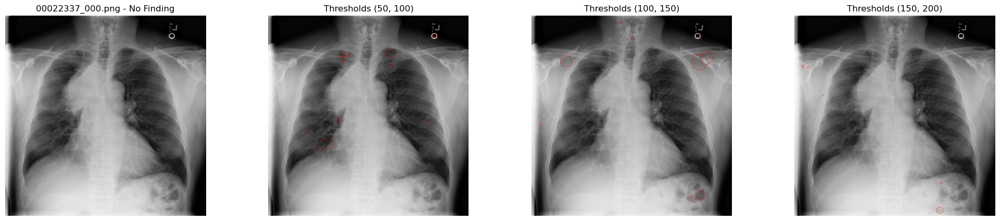

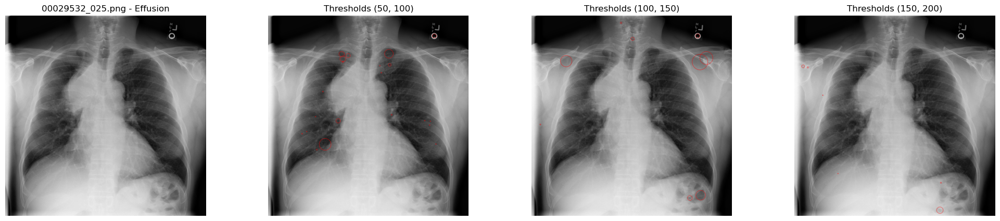

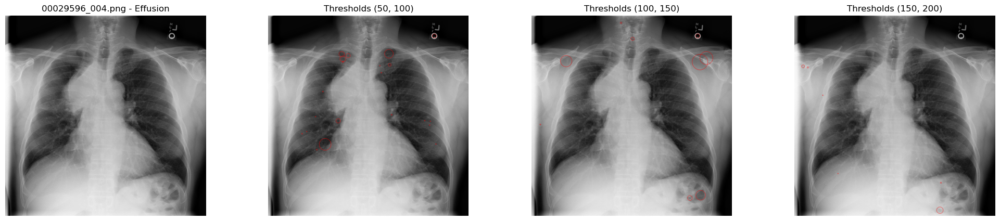

In [13]:
def BlobDetection(img_path, II, label, min_threshold1=50, max_threshold1=100, min_threshold2=100, max_threshold2=150, min_threshold3=150, max_threshold3=200):

    import cv2

    img = cv2.imread(all_image_paths['00010815_006.png'])
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    params1 = cv2.SimpleBlobDetector_Params()
    # Change thresholds
    params1.minThreshold = min_threshold1;
    params1.maxThreshold = max_threshold1;
    # Filter by Area.
    params1.filterByArea = True
    params1.minArea = 10
    # Filter by Circularity
    params1.filterByCircularity = True
    params1.minCircularity = 0.1
    # Filter by Convexity
    params1.filterByConvexity = True
    params1.minConvexity = 0.8
    # Filter by Inertia
    params1.filterByInertia = True
    params1.minInertiaRatio = 0.01
    
    params2 = cv2.SimpleBlobDetector_Params()
    # Change thresholds
    params2.minThreshold = min_threshold2;
    params2.maxThreshold = max_threshold2;
    # Filter by Area.
    params2.filterByArea = True
    params2.minArea = 10
    # Filter by Circularity
    params2.filterByCircularity = True
    params2.minCircularity = 0.1
    # Filter by Convexity
    params2.filterByConvexity = True
    params2.minConvexity = 0.8
    # Filter by Inertia
    params2.filterByInertia = True
    params2.minInertiaRatio = 0.01

    params3 = cv2.SimpleBlobDetector_Params()
    # Change thresholds
    params3.minThreshold = min_threshold3;
    params3.maxThreshold = max_threshold3;
    # Filter by Area.
    params3.filterByArea = True
    params3.minArea = 10
    # Filter by Circularity
    params3.filterByCircularity = True
    params3.minCircularity = 0.1
    # Filter by Convexity
    params3.filterByConvexity = True
    params3.minConvexity = 0.8
    # Filter by Inertia
    params3.filterByInertia = True
    params3.minInertiaRatio = 0.01

    detector1 = cv2.SimpleBlobDetector_create(params1)
    detector2 = cv2.SimpleBlobDetector_create(params2)
    detector3 = cv2.SimpleBlobDetector_create(params3)


    # Detect blobs.
    keypoints1 = detector1.detect(gray_img)
    keypoints2 = detector2.detect(gray_img)
    keypoints3 = detector3.detect(gray_img)

    # Draw detected blobs as red circles.
    # cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
    im_with_keypoints1 = cv2.drawKeypoints(img, keypoints1, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    im_with_keypoints2 = cv2.drawKeypoints(img, keypoints2, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    im_with_keypoints3 = cv2.drawKeypoints(img, keypoints3, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Show keypoints
    f=plt.figure(figsize= (25, 5))
    s1 = f.add_subplot(1, 4, 1)
    s1.set_title(f'{II} - {label}')
    plt.imshow(gray_img, cmap='gray')
    plt.axis('off')

    s2 = f.add_subplot(1, 4, 2)
    s2.set_title(f'Thresholds {(min_threshold1, max_threshold1)}')
    plt.imshow(im_with_keypoints1, cmap='gray')
    plt.axis('off')

    s3 = f.add_subplot(1, 4, 3)
    s3.set_title(f'Thresholds {(min_threshold2, max_threshold2)}')
    plt.imshow(im_with_keypoints2, cmap='gray')
    plt.axis('off')

    s4 = f.add_subplot(1, 4, 4)
    s4.set_title(f'Thresholds {(min_threshold3, max_threshold3)}')
    plt.imshow(im_with_keypoints3, cmap='gray')
    plt.axis('off')

sampled_images = prepared_df['Finding Labels'].sample(3)
for index, label in sampled_images.iteritems():
    BlobDetection(all_image_paths[index], index, label) 
del(sampled_images)  
